In [34]:
#IMPORTING ALL THE LIBRARIES NEEDED FOR THE VISUALIZATION AND MODELING
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

In [35]:
data = pd.read_csv('Washington_State_HDMA-2016.csv')
df = pd.DataFrame(data)

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (23,24,25,28,29,30,38,39,40) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


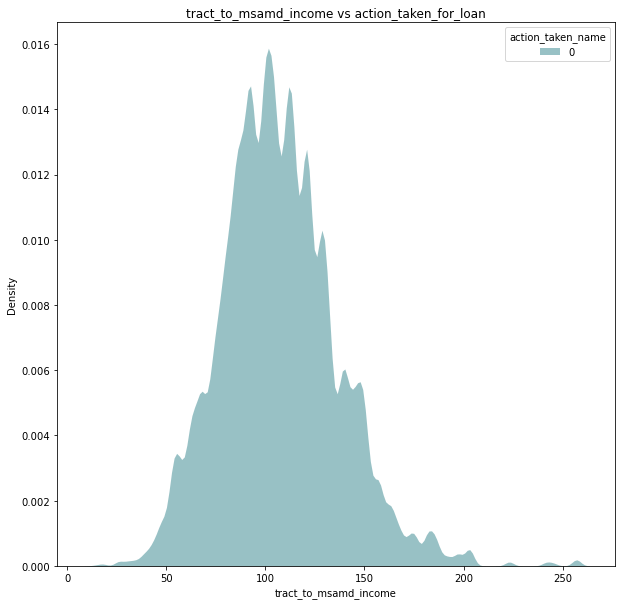

In [39]:
df_housing['action_taken_name']=["1" if x=="Loan originated" else "0" for x in df_housing['action_taken_name']]
df_housing['action_taken_name'].value_counts()
plt.figure(figsize = (10,10))
plt.title("tract_to_msamd_income vs action_taken_for_loan")
sns.kdeplot(data=df_housing, x="tract_to_msamd_income", hue="action_taken_name" , multiple="stack" ,  palette="crest" , alpha=.5, linewidth=0)
plt.show()

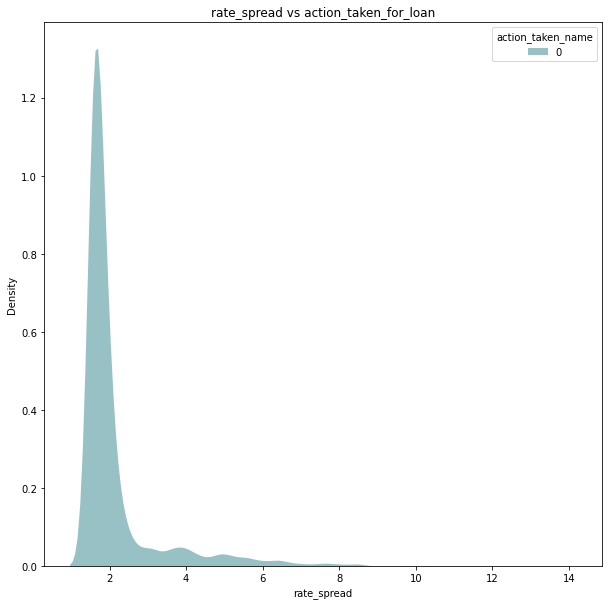

In [40]:
plt.figure(figsize = (10,10))
plt.title("rate_spread vs action_taken_for_loan")
sns.kdeplot(data=df_housing, x="rate_spread", hue="action_taken_name" , multiple="stack" ,  palette="crest" , alpha=.5, linewidth=0)
plt.show()

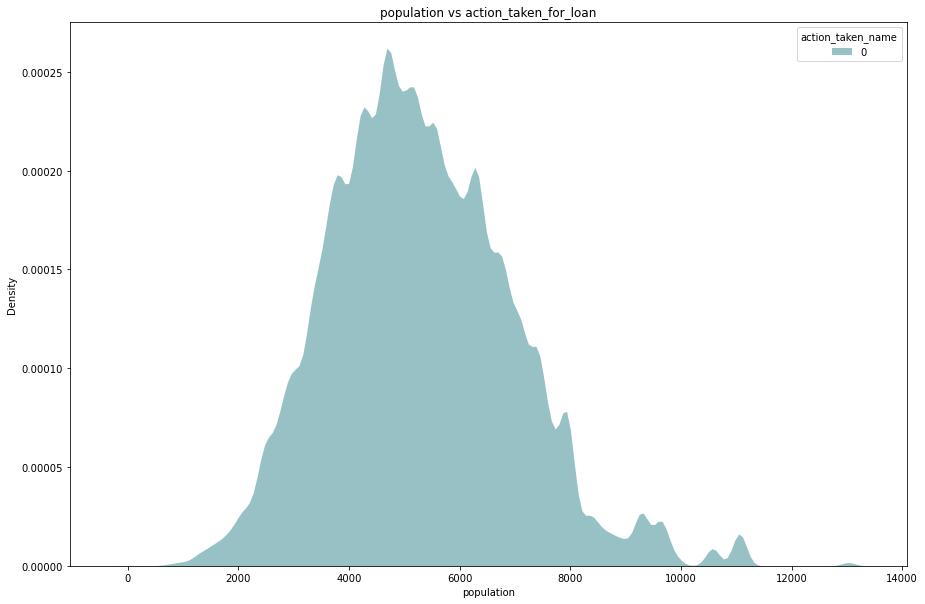

In [41]:
plt.figure(figsize = (15,10))
plt.title("population vs action_taken_for_loan")
sns.kdeplot(data=df_housing, x="population", hue="action_taken_name" , multiple="stack" ,  palette="crest" , alpha=.5, linewidth=0)
plt.show()

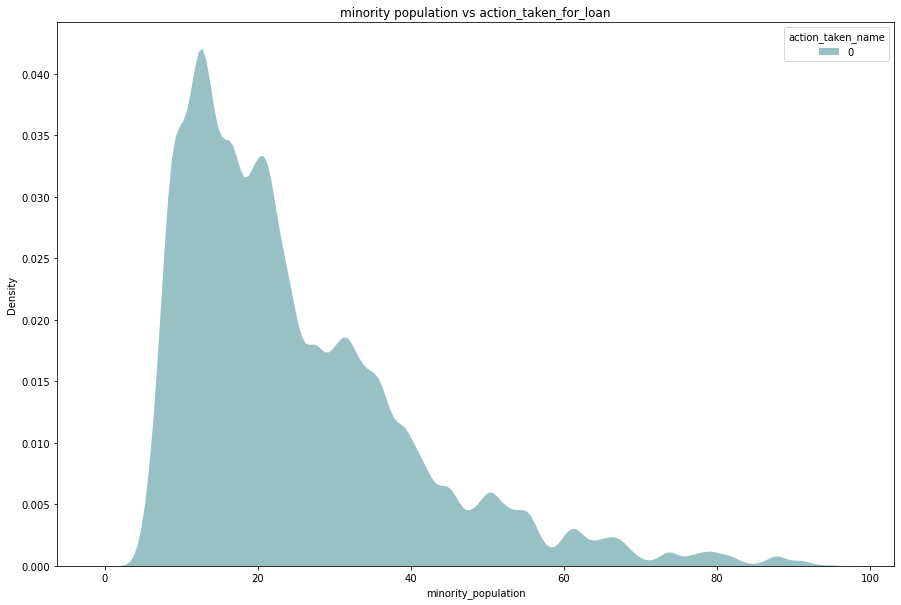

In [42]:
plt.figure(figsize = (15,10))
plt.title("minority population vs action_taken_for_loan")
sns.kdeplot(data=df_housing, x="minority_population", hue="action_taken_name" , multiple="stack" ,  palette="crest" , alpha=.5, linewidth=0)
plt.show()

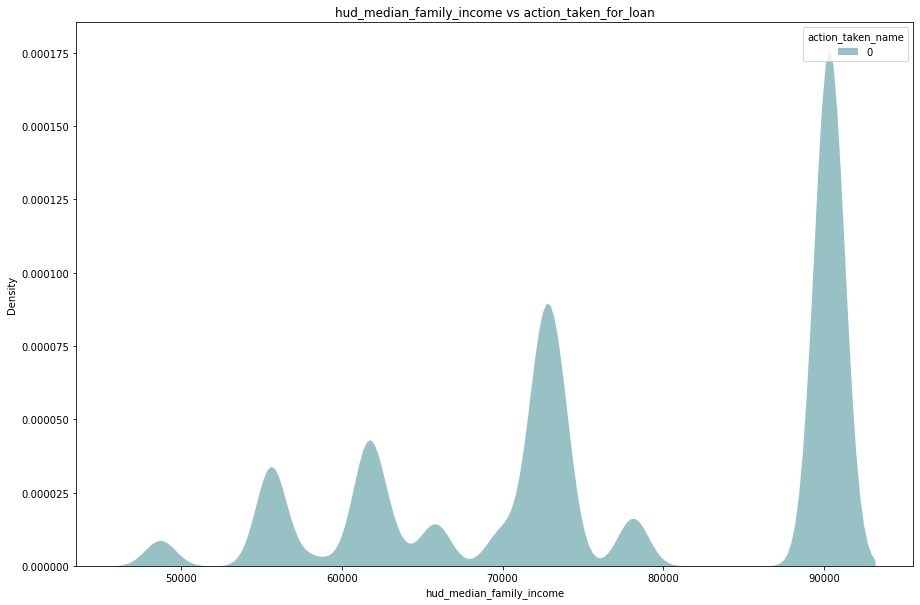

In [43]:
df_housing[['applicant_income_000s','loan_amount_000s']].groupby(df_housing['action_taken_name']).describe()
plt.figure(figsize = (15,10))
plt.title("hud_median_family_income vs action_taken_for_loan")
sns.kdeplot(data=df_housing, x="hud_median_family_income", hue="action_taken_name" , multiple="stack" ,  palette="crest" , alpha=.5, linewidth=0)
plt.show()

In [44]:
print(df_housing[['denial_reason_name_1',
               'denial_reason_name_2',
               'denial_reason_name_3']].isna().sum(),'\n\n')

print('Total available values = {}'.format(df_housing[['denial_reason_name_1',
                                                    'denial_reason_name_2',
                                                    'denial_reason_name_3']].notna().sum().sum()))

print('Total missing values = {}'.format(df_housing[['denial_reason_name_1',
                                                  'denial_reason_name_2',
                                                  'denial_reason_name_3']].isna().sum().sum()))

denial_reason_name_1    432067
denial_reason_name_2    459820
denial_reason_name_3    465320
dtype: int64 


Total available values = 42491
Total missing values = 1357207


In [45]:
df_loan_denial = df_housing[['denial_reason_name_1','denial_reason_name_2','denial_reason_name_3']]

df_loan_denial = pd.DataFrame(pd.concat([df_loan_denial['denial_reason_name_1'],
                                         df_loan_denial['denial_reason_name_2'],
                                         df_loan_denial['denial_reason_name_3']],
                                         ignore_index=True).value_counts(normalize=True),
                                         columns=['denial_reason_count'])

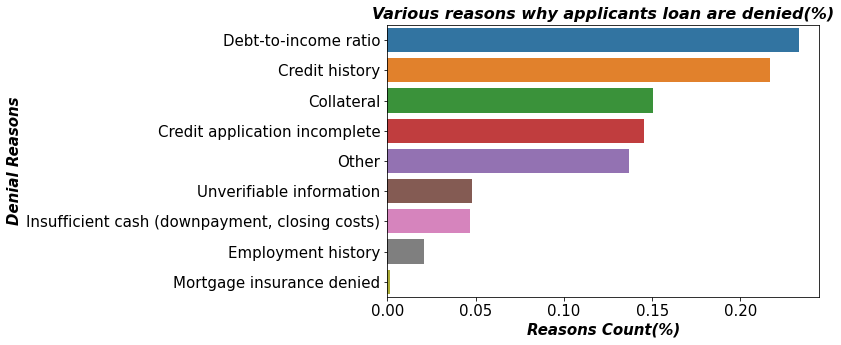

In [46]:
fig,ax  = plt.subplots(figsize=(10,5))

sns.barplot(y=df_loan_denial.index,x=df_loan_denial.denial_reason_count,orient='h');

plt.ylabel('Denial Reasons',fontdict={'fontsize':15,'fontstyle':'italic','fontweight':'bold'})

plt.xlabel('Reasons Count(%)',fontdict={'fontsize':15,'fontstyle':'italic','fontweight':'bold'})

plt.tick_params(axis='both',labelsize=15)

plt.subplots_adjust(left=0.3)

plt.title('Various reasons why applicants loan are denied(%)',
          fontdict={'fontsize':16,'fontstyle':'italic','fontweight':'bold'});

In [3]:
#!pip install -U pandas-profiling[notebook]
# TO INSTALL PANDAS PROFILING OPEN SOURCE PYTHON MODULE
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title='MPG Pandas Profiling Report', explorative = True)
profile

Summarize dataset:   0%|          | 0/60 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.columns

Index(['tract_to_msamd_income', 'rate_spread', 'population',
       'minority_population', 'number_of_owner_occupied_units',
       'number_of_1_to_4_family_units', 'loan_amount_000s',
       'hud_median_family_income', 'applicant_income_000s', 'state_name',
       'state_abbr', 'sequence_number', 'respondent_id', 'purchaser_type_name',
       'property_type_name', 'preapproval_name', 'owner_occupancy_name',
       'msamd_name', 'loan_type_name', 'loan_purpose_name', 'lien_status_name',
       'hoepa_status_name', 'edit_status_name', 'denial_reason_name_3',
       'denial_reason_name_2', 'denial_reason_name_1', 'county_name',
       'co_applicant_sex_name', 'co_applicant_race_name_5',
       'co_applicant_race_name_4', 'co_applicant_race_name_3',
       'co_applicant_race_name_2', 'co_applicant_race_name_1',
       'co_applicant_ethnicity_name', 'census_tract_number', 'as_of_year',
       'application_date_indicator', 'applicant_sex_name',
       'applicant_race_name_5', 'applicant_rac

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466566 entries, 0 to 466565
Data columns (total 47 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   tract_to_msamd_income           465951 non-null  float64
 1   rate_spread                     8638 non-null    float64
 2   population                      465956 non-null  float64
 3   minority_population             465956 non-null  float64
 4   number_of_owner_occupied_units  465944 non-null  float64
 5   number_of_1_to_4_family_units   465955 non-null  float64
 6   loan_amount_000s                466566 non-null  int64  
 7   hud_median_family_income        465960 non-null  float64
 8   applicant_income_000s           404533 non-null  float64
 9   state_name                      466566 non-null  object 
 10  state_abbr                      466566 non-null  object 
 11  sequence_number                 466566 non-null  int64  
 12  respondent_id   

In [6]:
df.shape

(466566, 47)

In [7]:
df = df.drop(['as_of_year','co_applicant_race_name_2','co_applicant_race_name_3','co_applicant_race_name_4','co_applicant_race_name_5','edit_status_name','state_abbr','state_name'], axis=1)
df = df.drop(['rate_spread'], axis=1)
df = df.drop(['sequence_number'], axis=1)
df = df.drop(['applicant_race_name_5','applicant_race_name_4','applicant_race_name_3','applicant_race_name_2'], axis=1)
df = df.drop(['denial_reason_name_3','denial_reason_name_2','denial_reason_name_1'], axis=1)
OBJECT_COL_List = ['respondent_id','purchaser_type_name','property_type_name','preapproval_name','owner_occupancy_name','msamd_name','loan_type_name','loan_purpose_name','lien_status_name','hoepa_status_name','denial_reason_name_3','denial_reason_name_2','denial_reason_name_1','county_name','co_applicant_sex_name','co_applicant_race_name_1','co_applicant_ethnicity_name','applicant_sex_name','applicant_race_name_5','applicant_race_name_4','applicant_race_name_3','applicant_race_name_2','applicant_race_name_1','applicant_ethnicity_name','agency_name','agency_abbr','action_taken_name']

In [8]:
#Imputing Missing Values - 

df['tract_to_msamd_income'].fillna(value=df['tract_to_msamd_income'].mean(),inplace=True)
df['population'].fillna(value=df['population'].mean(),inplace=True)
df['minority_population'].fillna(value=df['minority_population'].mean(),inplace=True)
df['number_of_owner_occupied_units'].fillna(value=df['number_of_owner_occupied_units'].mean(),inplace=True)
df['number_of_1_to_4_family_units'].fillna(value=df['number_of_1_to_4_family_units'].mean(),inplace=True)
df['loan_amount_000s'].fillna(value=df['loan_amount_000s'].mean(),inplace=True)
df['hud_median_family_income'].fillna(value=df['hud_median_family_income'].mean(),inplace=True)
df['applicant_income_000s'].fillna(value=df['applicant_income_000s'].mean(),inplace=True)
df['census_tract_number'].fillna(value=df['census_tract_number'].mean(),inplace=True)
df['application_date_indicator'].fillna(value=df['application_date_indicator'].mean(),inplace=True)
df['respondent_id'].fillna(value=df['respondent_id'].mode(),inplace=True)
df['purchaser_type_name'].fillna(value=df['purchaser_type_name'].mode(),inplace=True)
df['property_type_name'].fillna(value=df['property_type_name'].mode(),inplace=True)
df['preapproval_name'].fillna(value=df['preapproval_name'].mode(),inplace=True)
df['owner_occupancy_name'].fillna(value=df['owner_occupancy_name'].mode(),inplace=True)
df['msamd_name'].fillna(value=df['msamd_name'].mode(),inplace=True)
df['loan_type_name'].fillna(value=df['loan_type_name'].mode(),inplace=True)
df['loan_purpose_name'].fillna(value=df['loan_purpose_name'].mode(),inplace=True)
df['lien_status_name'].fillna(value=df['lien_status_name'].mode(),inplace=True)
df['hoepa_status_name'].fillna(value=df['hoepa_status_name'].mode(),inplace=True)
df['county_name'].fillna(value=df['county_name'].mode(),inplace=True)
df['co_applicant_sex_name'].fillna(value=df['co_applicant_sex_name'].mode(),inplace=True)
df['co_applicant_race_name_1'].fillna(value=df['co_applicant_race_name_1'].mode(),inplace=True)
df['co_applicant_ethnicity_name'].fillna(value=df['co_applicant_ethnicity_name'].mode(),inplace=True)
df['applicant_sex_name'].fillna(value=df['applicant_sex_name'].mode(),inplace=True)
df['applicant_race_name_1'].fillna(value=df['applicant_race_name_1'].mode(),inplace=True)
df['applicant_ethnicity_name'].fillna(value=df['applicant_ethnicity_name'].mode(),inplace=True)
df['agency_name'].fillna(value=df['agency_name'].mode(),inplace=True)
df['agency_abbr'].fillna(value=df['agency_abbr'].mode(),inplace=True)
df['action_taken_name'].fillna(value=df['action_taken_name'].mode(),inplace=True)

In [9]:
#Label Encoding the categorical values -

labelencoder=LabelEncoder()
df['respondent_id'] = labelencoder.fit_transform(df['respondent_id'])
df['purchaser_type_name'] = labelencoder.fit_transform(df['purchaser_type_name'])
df['property_type_name'] = labelencoder.fit_transform(df['property_type_name'])
df['preapproval_name'] = labelencoder.fit_transform(df['preapproval_name'])
df['owner_occupancy_name'] = labelencoder.fit_transform(df['owner_occupancy_name'])
df['loan_type_name'] = labelencoder.fit_transform(df['loan_type_name'])
df['loan_purpose_name'] = labelencoder.fit_transform(df['loan_purpose_name'])
df['lien_status_name'] = labelencoder.fit_transform(df['lien_status_name'])
df['hoepa_status_name'] = labelencoder.fit_transform(df['hoepa_status_name'])
df['county_name'] = labelencoder.fit_transform(df['county_name'].astype(str))
df['co_applicant_sex_name'] = labelencoder.fit_transform(df['co_applicant_sex_name'])
df['co_applicant_race_name_1'] = labelencoder.fit_transform(df['co_applicant_race_name_1'])
df['co_applicant_ethnicity_name'] = labelencoder.fit_transform(df['co_applicant_ethnicity_name'])
df['applicant_sex_name'] = labelencoder.fit_transform(df['applicant_sex_name'])
df['applicant_race_name_1'] = labelencoder.fit_transform(df['applicant_race_name_1'])
df['applicant_ethnicity_name'] = labelencoder.fit_transform(df['applicant_ethnicity_name'])
df['agency_abbr'] = labelencoder.fit_transform(df['agency_abbr'])


In [10]:
df['msamd_name'] = labelencoder.fit_transform(df['msamd_name'].astype(str))

In [11]:
df['msamd_name'] = labelencoder.fit_transform(df['msamd_name'].astype(str))df = df.drop(['agency_name'], axis=1)

In [12]:
df['loan_status']=["approved" if x=="Loan originated" else "not approved" for x in df['action_taken_name']]
df = df.drop(['action_taken_name'], axis=1)
df['loan_status'] = labelencoder.fit_transform(df['loan_status'])

In [13]:
df.drop_duplicates()

,tract_to_msamd_income,population,minority_population,number_of_owner_occupied_units,number_of_1_to_4_family_units,loan_amount_000s,hud_median_family_income,applicant_income_000s,respondent_id,purchaser_type_name,...,co_applicant_sex_name,co_applicant_race_name_1,co_applicant_ethnicity_name,census_tract_number,application_date_indicator,applicant_sex_name,applicant_race_name_1,applicant_ethnicity_name,agency_abbr,loan_status
0,121.690002,8381.000000,23.790001,2175.00000,2660.000000,227,73300.000000,116.0,440,4,...,2,3,3,413.270000,0,0,3,2,0,0
1,83.370003,4915.000000,23.990000,1268.00000,1777.000000,240,57900.000000,42.0,684,6,...,3,5,2,9208.010000,0,2,6,0,3,0
2,91.129997,5075.000000,11.820000,1136.00000,1838.000000,241,73300.000000,117.0,683,7,...,0,7,3,414.000000,0,2,6,2,3,0
3,146.169998,5032.000000,8.590000,1525.00000,1820.000000,351,73300.000000,315.0,442,7,...,0,3,1,405.100000,0,2,3,1,4,0
4,162.470001,5183.000000,10.500000,1705.00000,2104.000000,417,78100.000000,114.0,320,4,...,2,7,3,907.000000,0,0,6,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466561,106.906157,5288.219117,24.765475,1389.05978,1822.137288,178,76797.148468,97.0,236,7,...,2,7,3,1395.489104,0,0,6,2,3,1
466562,106.906157,5288.219117,24.765475,1389.05978,1822.137288,110,76797.148468,30.0,236,7,...,3,5,2,1395.489104,0,2,6,2,3,1
466563,106.906157,5288.219117,24.765475,1389.05978,1822.137288,420,76797.148468,71.0,236,7,...,3,5,2,1395.489104,0,0,3,1,3,1
466564,88.690002,4725.000000,45.880001,1188.00000,1686.000000,255,72300.000000,77.0,261,7,...,0,7,3,714.110000,0,2,6,2,3,1


In [14]:
#Split dataset into features and target.

target = df.iloc[:,-1:]
train = df.iloc[:,:-1]

In [15]:
#Standardize features by removing the mean and scaling to unit variance - Sklearn - StandardScaler

scaled_features = StandardScaler().fit_transform(train.values)
scaled_features_df = pd.DataFrame(scaled_features, index=train.index, columns=train.columns)

In [16]:
#Spliting dataset into train and test split

X_train, X_test, y_train, y_test = train_test_split(train, target, test_size=0.2, random_state=42)
print(f"Shape -> {X_train.shape}")
print(f"Shape -> {X_test.shape}")
print(f"Shape -> {y_train.shape}")
print(f"Shape -> {y_test.shape}")

Shape -> (373252, 28)
Shape -> (93314, 28)
Shape -> (373252, 1)
Shape -> (93314, 1)


# --------------------------------------------------------------------------------------------------------------

# LogisticRegression 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


              precision    recall  f1-score   support

           0       0.57      0.97      0.72     52865
           1       0.49      0.04      0.07     40449

    accuracy                           0.57     93314
   macro avg       0.53      0.50      0.40     93314
weighted avg       0.54      0.57      0.44     93314



<AxesSubplot:>

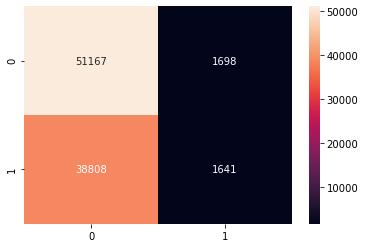

In [17]:
clf = LogisticRegression(random_state=10).fit(X_train, y_train)

y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)

print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict)
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")

# RandomForestClassifier

<ipython-input-18-b89c04cdafb8>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


              precision    recall  f1-score   support

           0       0.82      0.93      0.87     52865
           1       0.88      0.73      0.80     40449

    accuracy                           0.84     93314
   macro avg       0.85      0.83      0.83     93314
weighted avg       0.84      0.84      0.84     93314



<AxesSubplot:>

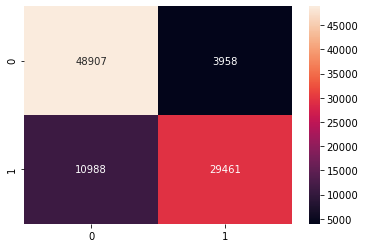

In [18]:
clf = RandomForestClassifier(max_depth=2, random_state=42)

clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)

print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict)
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")

# DecisionTreeClassifier

              precision    recall  f1-score   support

           0       0.90      0.90      0.90     52865
           1       0.87      0.86      0.87     40449

    accuracy                           0.88     93314
   macro avg       0.88      0.88      0.88     93314
weighted avg       0.88      0.88      0.88     93314



<AxesSubplot:>

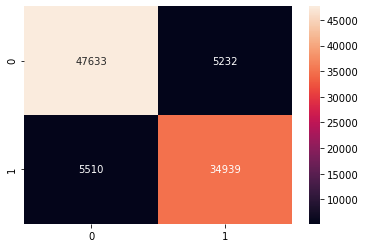

In [19]:
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)

print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict)
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")

# Performing RandomisedSearchCV on Random Forest Classifier

In [20]:
#RandomizedSearchCV with randomforest
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

scores = ['f1_micro']
from sklearn.ensemble import RandomForestClassifier
for score in scores:



    tuned_parameters = [{'bootstrap': [True, False],
                      'max_depth': [5,8,10],
                      'n_estimators': [150, 200, 300, 350, 500 ,600 , 700],
                      'max_features': [5,6,7,8] }]
                      
    clf = RandomizedSearchCV(RandomForestClassifier(),
      tuned_parameters ,verbose=1, cv=3, n_jobs=-1, scoring='%s' % score
    )
    
    
    
    clf.fit(X_train, y_train)

    print("\nBest parameters set found are:")
    print()
    print(clf.best_params_)
    
    
   
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print("")

Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:880: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)



Best parameters set found are:

{'n_estimators': 150, 'max_features': 8, 'max_depth': 10, 'bootstrap': True}

              precision    recall  f1-score   support

           0       0.97      0.86      0.91     52865
           1       0.84      0.97      0.90     40449

    accuracy                           0.90     93314
   macro avg       0.90      0.91      0.90     93314
weighted avg       0.91      0.90      0.90     93314




# Random Forest Model with best parameters

<ipython-input-21-3fdf51b7f094>:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


              precision    recall  f1-score   support

           0       0.97      0.86      0.91     52865
           1       0.84      0.97      0.90     40449

    accuracy                           0.90     93314
   macro avg       0.90      0.91      0.90     93314
weighted avg       0.91      0.90      0.90     93314



<AxesSubplot:>

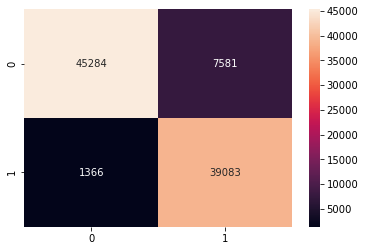

In [21]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(
n_estimators = 150, max_features = 7, max_depth = 10, bootstrap = False)

clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)


print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict )
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")

# Applying RandomisedSearchCV on Decision Tree

In [22]:

from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
scores = ['f1_micro']

for score in scores:



    tuned_parameters = [{
                      'max_depth': [5,8,10],
                      'min_samples_split' : [2,4,6],
                      'max_features': [5,6,7,8] }]
                      
    clf = RandomizedSearchCV(DecisionTreeClassifier(),
      tuned_parameters ,verbose=1, cv=3, n_jobs=-1, scoring='%s' % score
    )
    
    
    
    clf.fit(X_train, y_train)

    print("\nBest parameters set found are:")
    print()
    print(clf.best_params_)
    
    
   
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print("")

Fitting 3 folds for each of 10 candidates, totalling 30 fits

Best parameters set found are:

{'min_samples_split': 2, 'max_features': 8, 'max_depth': 10}

              precision    recall  f1-score   support

           0       0.96      0.86      0.91     52865
           1       0.84      0.95      0.89     40449

    accuracy                           0.90     93314
   macro avg       0.90      0.91      0.90     93314
weighted avg       0.91      0.90      0.90     93314




# Gradient Boosting Classifier

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


              precision    recall  f1-score   support

           0       0.98      0.83      0.90     52865
           1       0.82      0.98      0.89     40449

    accuracy                           0.89     93314
   macro avg       0.90      0.90      0.89     93314
weighted avg       0.91      0.89      0.89     93314



<AxesSubplot:>

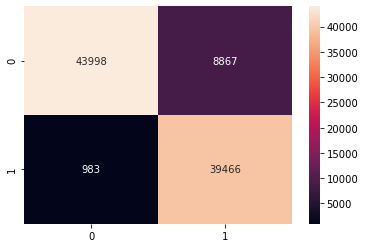

In [23]:
from sklearn.ensemble import GradientBoostingClassifier

clf = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.001, max_depth=4, random_state=0).fit(X_train, y_train)

y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)

print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict)
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")

# AdaBoostClassifier

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


              precision    recall  f1-score   support

           0       0.95      0.89      0.92     52865
           1       0.86      0.94      0.90     40449

    accuracy                           0.91     93314
   macro avg       0.90      0.91      0.91     93314
weighted avg       0.91      0.91      0.91     93314



<AxesSubplot:>

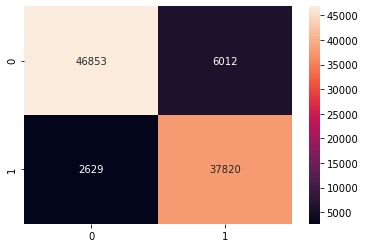

In [24]:
from sklearn.ensemble import AdaBoostClassifier

clf = AdaBoostClassifier(n_estimators=1000, random_state=10)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
accuracy_score(y_test, y_predict)

print(classification_report(y_test, y_predict))
classifier_df = confusion_matrix(y_test, y_predict)
np.set_printoptions(suppress=True)
sns.heatmap(classifier_df, annot=True,fmt="d")